# Temporal analysis of:
1. Multi-Electrode_Arrays with $10 \times 10$ electrodes
1. Fourier, Short-Time-Fourier, and Wavelet thresholding
2. low(10), mudium(20), and high(30) density of neurons
 

In [1]:
import matplotlib.pyplot as plt
size=25
parameters = {'axes.labelsize': size, 'axes.titlesize': size, 'figure.titlesize': size,
              'xtick.labelsize': size, 'ytick.labelsize': size, 'legend.fontsize': 15,
              'legend.title_fontsize': 15, 'figure.figsize':(12,4)}
plt.rcParams.update(parameters)
import numpy as np
import pandas as pd
import time

import MEArec as mr
import MEAutility
import spikeinterface as si
import spikeinterface.sorters as ss
import spikeinterface.extractors as se
import spikeinterface.comparison as sc
import spikeinterface.sorters as ssort
import spikeinterface.toolkit as st
import spikeinterface.widgets as sw

import pywt
import seaborn as sns
from scipy import signal
from scipy.fftpack import fft, ifft, dct, idct
import scipy.signal as signal

In [2]:
def make_sparse(x,t):
    l = x.reshape(-1)
    p = np.argsort(np.abs(l))[-t]
    s = np.ma.masked_where(np.abs(x) < np.abs(l[p]), x)
    y = np.ma.filled(s.astype(float), 0.0)
    return y 

## A. Load recording

In [3]:
recording, gt = se.read_mearec('data/MEA10*10/recgen_cell_10/0.h5')

In [4]:
sv = recording.get_traces()
ns = recording.get_num_samples()
nch = recording.get_num_channels()
fs = recording.get_sampling_frequency()
nseg = recording.get_num_segments()
probe = recording.get_probe()
sv.shape

(1920000, 100)

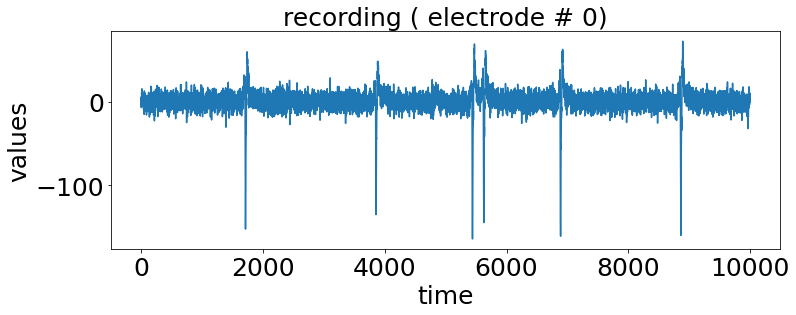

In [5]:
plt.xlabel('time')
plt.ylabel('values')
plt.title('recording ( electrode # 0)')
plt.plot(sv[:10000,0])

In [6]:
sorting_IC = ss.run_ironclust(recording=recording, output_folder='tmp_IC')

RUNNING SHELL SCRIPT: /tmp/tmp_shellscript19sg5ucw/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscripty9lxqhv5/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscriptv19h_i97/script.sh
RUNNING SHELL SCRIPT: tmp_IC/run_ironclust.sh


In [10]:
comparison_gt = sc.compare_sorter_to_ground_truth(tested_sorting=sorting_IC, gt_sorting=gt, exhaustive_gt=True)

PERFORMANCE (pooled_with_average)
-----------
ACCURACY: 90.93396211750827
RECALL: 98.7299980333226
PRECISION: 92.19520823453291
FALSE DISCOVERY RATE: 7.804791765467109
MISS RATE: 1.2700019666773785

SUMMARY
-------
GT num_units: 10
TESTED num_units: 11
num_well_detected: 8
num_redundant: 0
num_overmerged: 0
num_false_positive_units 1
num_bad: 1



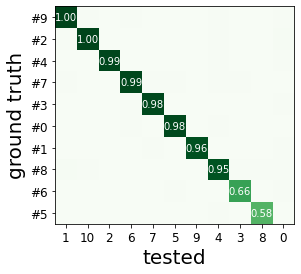

In [11]:
comparison_gt.print_performance()
comparison_gt.print_summary()
sw.plot_agreement_matrix(comparison_gt)

<AxesSubplot:title={'center':'recording ( one channel)'}, xlabel='measurement', ylabel='value'>

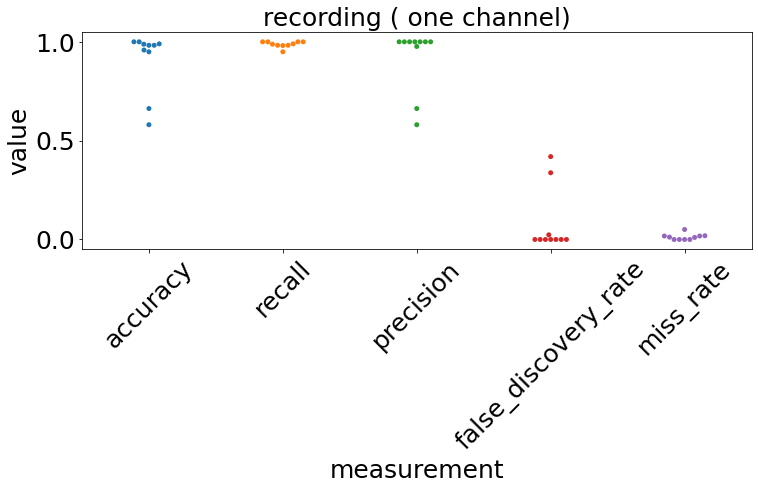

In [13]:
perf_IC = comparison_gt.get_performance()
s = perf_IC
perf2 = pd.melt(perf_IC, var_name='measurement')
plt.xticks(rotation=45)
plt.xlabel('frequency')
plt.ylabel('values')
plt.title('recording ( one channel)')
sns.swarmplot(data=perf2, x='measurement', y='value')

In [14]:
we = si.extract_waveforms(recording, sorting_IC, folder='wf_quality_metrics', overwrite=True, n_jobs=10, chunk_size=recording.get_num_samples()//10, progress_bar=True)

extract waveforms: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:02<00:00,  4.16it/s]


In [15]:
qm = st.compute_quality_metrics(we, metric_names=['snr', 'isi_violation', 'firing_rate'])
qm

,snr,isi_violations_ratio,isi_violations_rate,isi_violations_count,firing_rate
0,0.647576,0.402392,297.583333,17855,496.500000
1,18.279646,0.000000,0.000000,0,12.933333
2,20.908154,0.000000,0.000000,0,4.766667
3,29.955954,10.647932,3.566667,214,10.566667
4,52.856789,0.000000,0.000000,0,15.033333
5,20.882334,0.000000,0.000000,0,4.666667
6,18.122532,0.000000,0.000000,0,10.933333
7,15.057605,0.000000,0.000000,0,4.666667
8,24.072161,19.325108,3.033333,182,7.233333
9,14.278966,0.444998,0.016667,1,3.533333


## B. DCT (Fourier) with 1 $\%$ sparsity:

In [17]:
svf = dct(sv, axis=0)

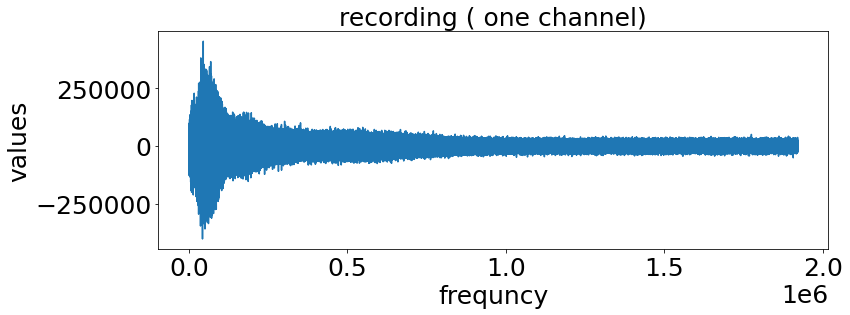

In [18]:
plt.figure(figsize=(12,4))
plt.xlabel('frequncy')
plt.ylabel('values')
plt.title('recording ( one channel)')
plt.plot(svf[1:,0])

In [19]:
svf_sparse = np.zeros((ns,nch))
for i in range(nch):
    svf_sparse[:,i] = make_sparse(svf[:,i], ns//100)

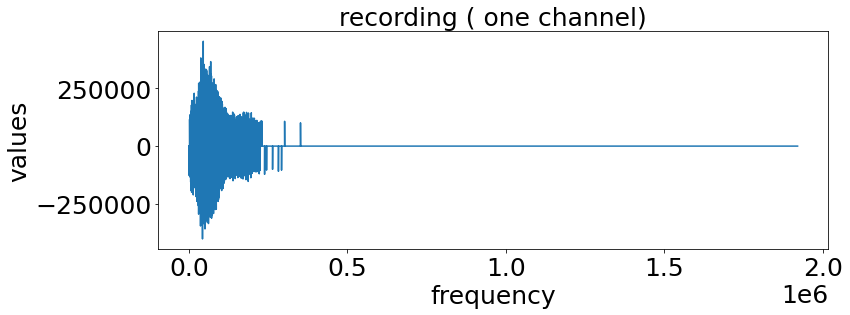

In [21]:
plt.xlabel('frequency')
plt.ylabel('values')
plt.title('recording ( one channel)')
plt.plot(svf_sparse[1:, 0])

In [23]:
sv_t = idct(svf_sparse, axis = 0) / ns / 2

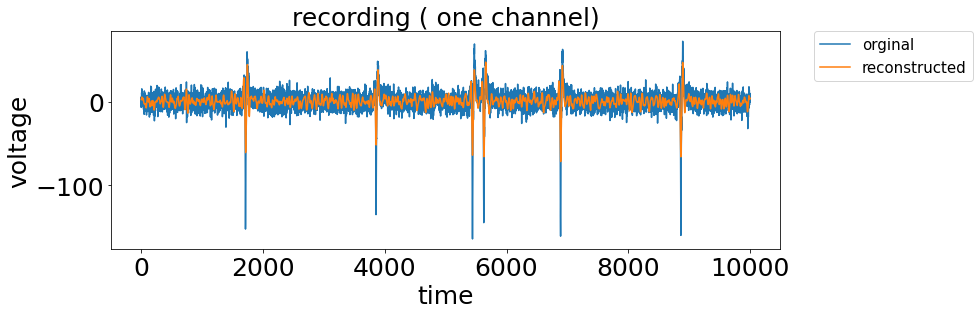

In [29]:
plt.ylabel('voltage')
plt.xlabel('time')
plt.title('recording ( one channel)')
plt.plot(sv[:10000,0], label='orginal')
plt.plot(sv_t[:10000,0], label='reconstructed')
plt.legend(bbox_to_anchor=(1.05, 1),
                         loc='upper left', borderaxespad=0.)

In [30]:
recording_t = se.NumpyRecording(sv_t, sampling_frequency=fs)
probe = recording.get_probe() # get the probe from orginal recording
recording_t = recording_t.set_probe(probe)

In [31]:
sorting_IC_t = ss.run_ironclust(recording=recording_t, output_folder='tmp_IC')

RUNNING SHELL SCRIPT: /tmp/tmp_shellscriptwha_fp4y/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscript984w71xd/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscriptzozl7yk1/script.sh
RUNNING SHELL SCRIPT: tmp_IC/run_ironclust.sh
The extractor was not dumpable


In [32]:
comparison_gt = sc.compare_sorter_to_ground_truth(tested_sorting=sorting_IC_t, gt_sorting=gt, exhaustive_gt=True)

PERFORMANCE (pooled_with_average)
-----------
ACCURACY: 96.60266434050101
RECALL: 97.39035317834993
PRECISION: 99.17052426313508
FALSE DISCOVERY RATE: 0.8294757368649125
MISS RATE: 2.6096468216500606

SUMMARY
-------
GT num_units: 10
TESTED num_units: 13
num_well_detected: 10
num_redundant: 0
num_overmerged: 0
num_false_positive_units 3
num_bad: 3



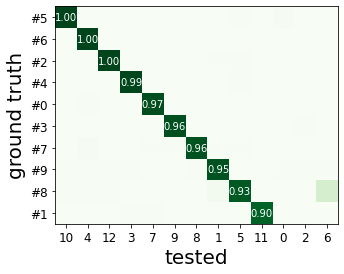

In [33]:
comparison_gt.print_performance()
comparison_gt.print_summary()
sw.plot_agreement_matrix(comparison_gt)

<AxesSubplot:title={'center':'recording ( one channel)'}, xlabel='measurement', ylabel='value'>

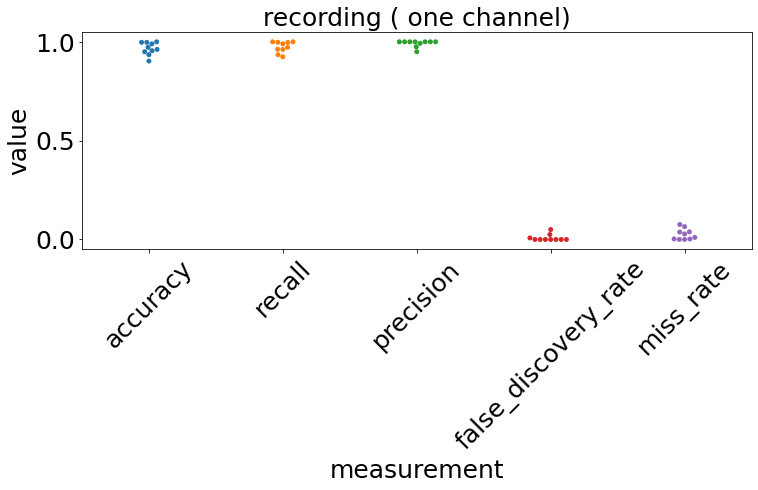

In [34]:
perf_IC = comparison_gt.get_performance()
s = perf_IC
perf2 = pd.melt(perf_IC, var_name='measurement')
plt.xticks(rotation=45)
plt.xlabel('frequency')
plt.ylabel('values')
plt.title('recording ( one channel)')
sns.swarmplot(data=perf2, x='measurement', y='value')

In [35]:
recording_t.annotate(is_filtered=True)
we = si.extract_waveforms(recording_t, sorting_IC_t, folder='wf_quality_metrics', overwrite=True, n_jobs=10, chunk_size=recording_t.get_num_samples()//10, progress_bar=True)

Setting 'return_scaled' to False
RecordingExtractor is not dumpable and can't be processed in parallel
RecordingExtractor is not dumpable and can't be processed in parallel


extract waveforms: 100%|######################################################################################################################################################| 10/10 [00:10<00:00,  1.03s/it]


In [36]:
qm = st.compute_quality_metrics(we, metric_names=['snr', 'isi_violation', 'firing_rate'])
qm

,snr,isi_violations_ratio,isi_violations_rate,isi_violations_count,firing_rate
0,1.885642,1.170829,19.600000,1176,74.700000
1,11.967523,0.089889,0.050000,3,13.616667
2,1.217639,0.759864,31.750000,1905,118.016667
3,16.222178,0.000000,0.000000,0,4.766667
4,18.262167,0.000000,0.000000,0,6.983333
5,12.202248,0.000000,0.000000,0,14.800000
6,6.611851,1.552524,0.066667,4,3.783333
7,14.329607,0.000000,0.000000,0,4.616667
8,8.112897,0.096447,0.033333,2,10.733333
9,12.558666,0.000000,0.000000,0,4.566667


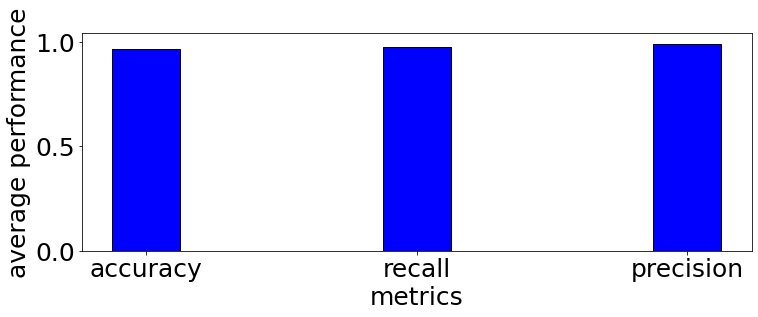

In [37]:
width = 0.25
n = ['accuracy', 'recall', 'precision']
plt.bar(n, s.mean().iloc[:3], color = 'b',
        width = width, edgecolor = 'black',
        label='average ')
plt.xlabel("metrics")
plt.ylabel("average performance")

plt.show()

SNR is a proper metric to remove fake detected cells with spike-sorting such that cells with low SNR can be removed. 

## C. STFT with 1 $\%$ sparsity:

In [38]:
wl = 10000
bc = signal.windows.boxcar(wl, sym=True)
f, t, Zxx = signal.stft(sv[:,1], fs=fs, window=bc, nperseg=wl, axis=0)

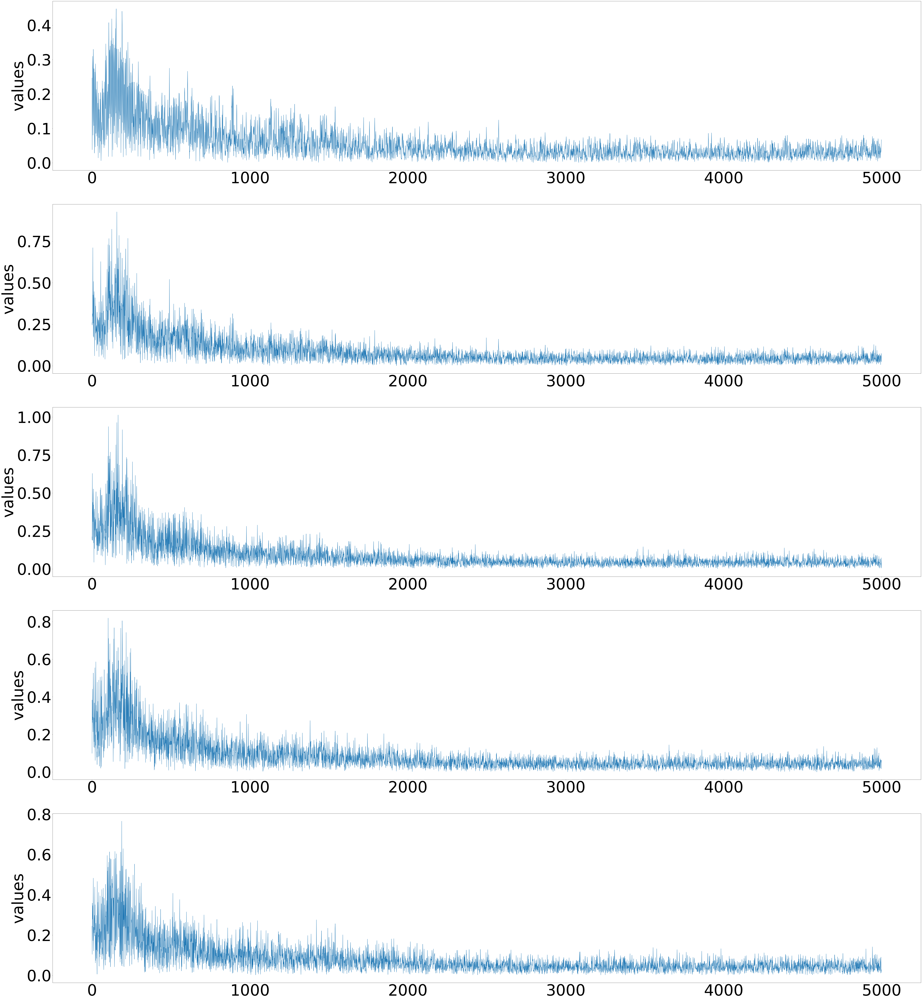

In [41]:
plt.figure(figsize=(100,140))
l=5
for i in range(l):
    plt.subplot(l+1,1,i+1)
    plt.plot(abs(Zxx[1:10000,i]))
    plt.ylabel('values', fontsize=100)
    plt.rc('xtick', labelsize=100) 
    plt.rc('ytick', labelsize=100)

In [42]:
# Use list instead of numpy array because of memory issues
Zxx_t = np.zeros((Zxx.shape))
Zxx_t = make_sparse(Zxx.real, ns//100) + 1j*Zxx.imag

/links/groups/hierlemann/spikesorting/miniconda3/envs/eazizi/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/links/groups/hierlemann/spikesorting/miniconda3/envs/eazizi/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/links/groups/hierlemann/spikesorting/miniconda3/envs/eazizi/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/links/groups/hierlemann/spikesorting/miniconda3/envs/eazizi/lib/python3.8/site-packages/matplotlib/cbook/__init__.py:1298: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)
/links/groups/hierlemann/spikesorting/miniconda3/envs/eazizi/lib/python3.8/site-pack

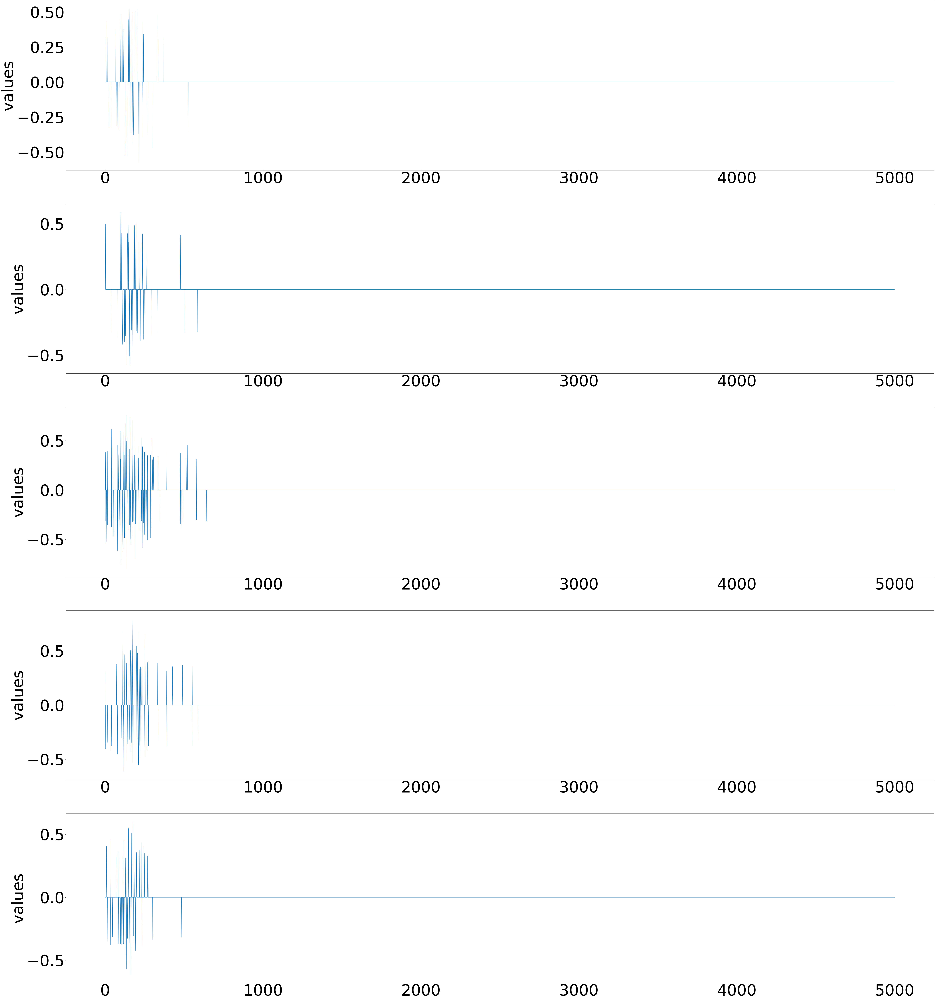

In [44]:
plt.figure(figsize=(100,140))
l=5
for i in range(l):
    plt.subplot(l+1,1,i+1)
    plt.plot(Zxx_t[1:,i+10])
    plt.ylabel('values', fontsize=100)
    plt.rc('xtick', labelsize=100) 
    plt.rc('ytick', labelsize=100)

In [45]:
bc = signal.windows.boxcar(wl, sym=True)
sv_t = np.zeros(sv.shape)
for i in range(nch):
    _, _, Zxx = signal.stft(sv[:,i], fs=fs)
    _, sv_t[:,i] = signal.istft(make_sparse(Zxx.real, ns//100) + 1j*Zxx.imag, fs)


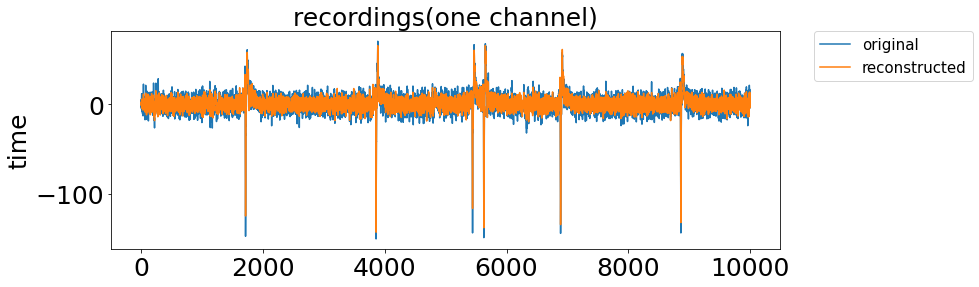

In [53]:
plt.rcParams.update(parameters)
plt.plot(sv[:10000,1], label='original')
plt.plot(sv_t[:10000,1], label='reconstructed')
plt.ylabel('values')
plt.ylabel('time')
plt.title('recordings(one channel)')
plt.legend(bbox_to_anchor=(1.05, 1),
                         loc='upper left', borderaxespad=0.)

In [47]:
recording_t = se.NumpyRecording(sv_t, sampling_frequency=fs)
probe = recording.get_probe() # get the probe from orginal recording
recording_t = recording_t.set_probe(probe)

In [57]:
sorting_IC_t = ss.run_ironclust(recording=recording_t, output_folder='tmp_IC')

RUNNING SHELL SCRIPT: /tmp/tmp_shellscriptoakkzehi/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscript53lhsxkp/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscriptiac9tvri/script.sh
RUNNING SHELL SCRIPT: tmp_IC/run_ironclust.sh
The extractor was not dumpable


In [58]:
comparison_gt = sc.compare_sorter_to_ground_truth(tested_sorting=sorting_IC_t, gt_sorting=gt, exhaustive_gt=True)

PERFORMANCE (pooled_with_average)
-----------
ACCURACY: 94.88109162395408
RECALL: 98.79666469998926
PRECISION: 96.08246390212942
FALSE DISCOVERY RATE: 3.9175360978705847
MISS RATE: 1.2033353000107119

SUMMARY
-------
GT num_units: 10
TESTED num_units: 15
num_well_detected: 9
num_redundant: 0
num_overmerged: 0
num_false_positive_units 5
num_bad: 5



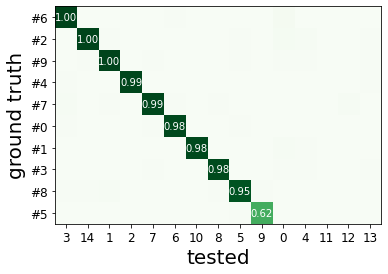

In [59]:
comparison_gt.print_performance()
comparison_gt.print_summary()
sw.plot_agreement_matrix(comparison_gt)

<AxesSubplot:title={'center':'recording ( one channel)'}, xlabel='measurement', ylabel='value'>

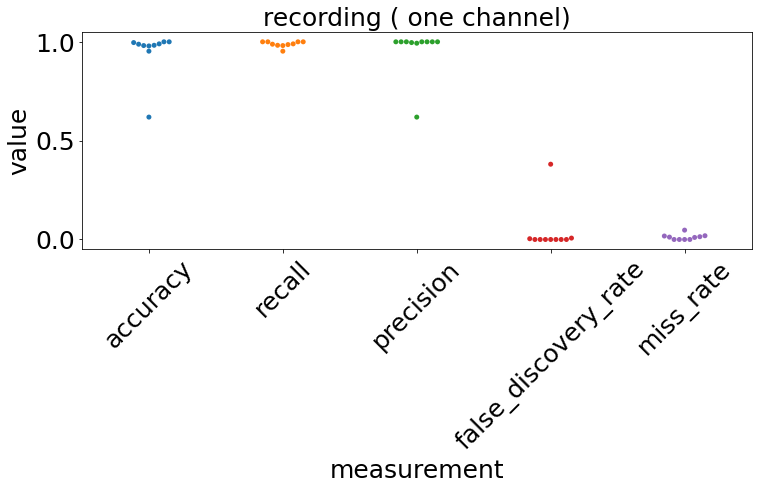

In [60]:
perf_IC = comparison_gt.get_performance()
s = perf_IC
perf2 = pd.melt(perf_IC, var_name='measurement')
plt.xticks(rotation=45)
plt.xlabel('frequency')
plt.ylabel('values')
plt.title('recording ( one channel)')
sns.swarmplot(data=perf2, x='measurement', y='value')

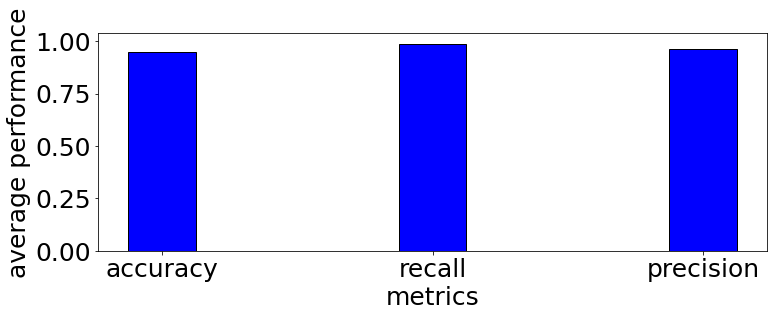

In [61]:
n = ['accuracy', 'recall', 'precision']
plt.bar(n, s.mean().iloc[:3], color = 'b',
        width = width, edgecolor = 'black',
        label='average ')
plt.xlabel("metrics", fontsize = 25)
plt.ylabel("average performance", fontsize = 25)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)

plt.show()

In [48]:
recording_t.annotate(is_filtered=True)
we60 = si.extract_waveforms(recording_t, sorting_IC_t,
                            folder='wf_quality_metrics',
                            overwrite=True, n_jobs=10,
                            chunk_size=recording_t.get_num_samples()//10,
                            progress_bar=True)

Setting 'return_scaled' to False
RecordingExtractor is not dumpable and can't be processed in parallel
RecordingExtractor is not dumpable and can't be processed in parallel


extract waveforms: 100%|########################| 10/10 [00:12<00:00,  1.23s/it]


In [63]:
qm = st.compute_quality_metrics(we60, metric_names=['snr', 'isi_violation', 'firing_rate'])
qm

,snr,isi_violations_ratio,isi_violations_rate,isi_violations_count,firing_rate
0,2.141170,0.739290,98.866667,5932,211.133333
1,25.426900,0.032958,0.016667,1,12.983333
2,29.414183,0.000000,0.000000,0,4.766667
3,67.783274,0.000000,0.000000,0,7.000000
4,0.868742,0.486916,78.883333,4733,232.383333
5,69.103282,0.000000,0.000000,0,15.083333
6,28.482071,0.000000,0.000000,0,4.666667
7,21.332896,0.000000,0.000000,0,10.933333
8,20.060662,0.000000,0.000000,0,4.716667
9,36.193210,18.714269,2.583333,155,6.783333


SNR is a proper metric to remove fake detected cells with spike-sorting such that cells with low SNR can be removed.<br>
In general $1\%$ sparse data has at least the same performance as original data and with proper choice of the window length even better performance w.r.t the original data. 

## D:  WT with 1 $\%$ sparsity: 

### D.1. Trun_coef: truncate coefficients in each level

In [5]:
def trun_coef(coeffs, t):
    coef_arr, coef_slices = pywt.coeffs_to_array(coeffs, padding=0, axes=None)
    coef_arr_t = np.zeros(len(coef_arr))
    p = round(t*len(coef_arr[coef_slices[0]]))
    coef_arr_t[coef_slices[0]] = make_sparse(coef_arr[coef_slices[0]], p)
    p = round(t*len(coef_arr[coef_slices[l-1]['d']]))
    coef_arr_t[coef_slices[l-1]['d']] = np.zeros(coef_arr[coef_slices[l-1]['d']].shape)
    for j in range(l-1):
        p = round(t*len(coef_arr[coef_slices[j]['d']]))
        coef_arr_t[coef_slices[j]['d']] = make_sparse(coef_arr[coef_slices[j+1]['d']], p)
    coef_t = pywt.array_to_coeffs(coef_arr_t, coef_slices, output_format='wavedec')
    return coef_t

### D.2. trun2_coef: truncate coefficients all together 

In [6]:
# denoising by remove two highest details coefficients and truncate the rest with the t percent
def trun2_coef(coeffs, t):
    coef_arr, coef_slices = pywt.coeffs_to_array(coeffs, padding=0, axes=None)
    coef_arr_t = np.zeros(len(coef_arr))
    p = round(t*len(coef_arr[coef_slices[0]]))
    coef_arr_t[coef_slices[0]] = make_sparse(coef_arr[coef_slices[0]], p)
    p = round(t*len(coef_arr[coef_slices[l-1]['d']]))
    coef_arr_t[coef_slices[l-1]['d']] = np.zeros(coef_arr[coef_slices[l-1]['d']].shape)
    p = round(t*len(coef_arr[coef_slices[l-2]['d']]))
    coef_arr_t[coef_slices[l-2]['d']] = np.zeros(coef_arr[coef_slices[l-2]['d']].shape)
    for j in range(l-2):
        p = round(t*len(coef_arr[coef_slices[j+1]['d']]))
        coef_arr_t[coef_slices[j+1]['d']] = make_sparse(coef_arr[coef_slices[j+1]['d']], p)
    coef_t = pywt.array_to_coeffs(coef_arr_t, coef_slices, output_format='wavedec')
    return coef_t

In [7]:
l = 5
for i in range(nch):
    coeffs = pywt.wavedec(sv[:,i], 'haar', level=l)
    coef_arr, coef_slices = pywt.coeffs_to_array(coeffs, padding=0, axes=None) 

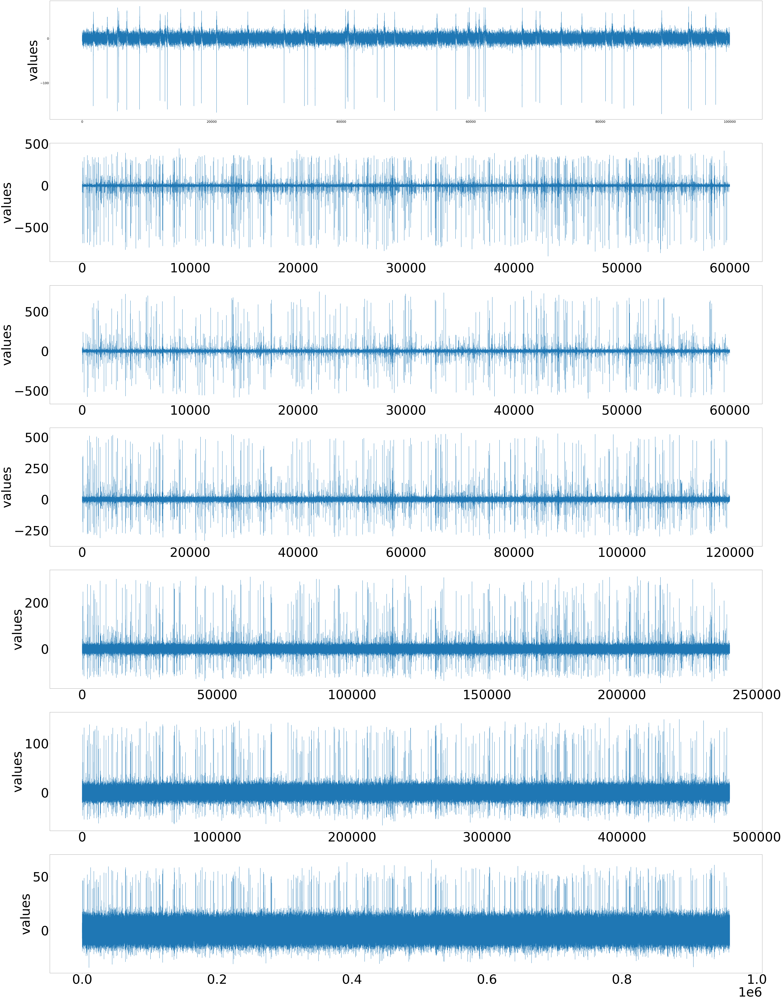

In [8]:
plt.rcParams['agg.path.chunksize'] = 10000
plt.figure(figsize=(100,140))
plt.subplot(l+2,1,1)
plt.plot(sv[:100000,0])
plt.ylabel('values', fontsize=100)
plt.rc('xtick', labelsize=100) 
plt.rc('ytick', labelsize=100)
plt.subplot(l+2,1,2)
plt.plot(coef_arr[coef_slices[0][:1000]])
plt.ylabel('values', fontsize=100)
plt.rc('xtick', labelsize=100) 
plt.rc('ytick', labelsize=100)
for i in range(l):
    plt.subplot(l+2,1,i+3)
    plt.plot(coef_arr[coef_slices[i+1]['d'][:1000]])
    plt.ylabel('values', fontsize=100)
#    plt.title('detail'+str(i+1), fontsize=100)
    plt.rc('xtick', labelsize=100) 
    plt.rc('ytick', labelsize=100)

In [9]:
# AS the last two high-frequency coefficients are totally removed the 4 percent
# truncation of the rest 4 decomposition levels are equal to the 1 percent in total. 
s_coef = trun2_coef(coeffs, .04)

<Figure size 1080x576 with 0 Axes>

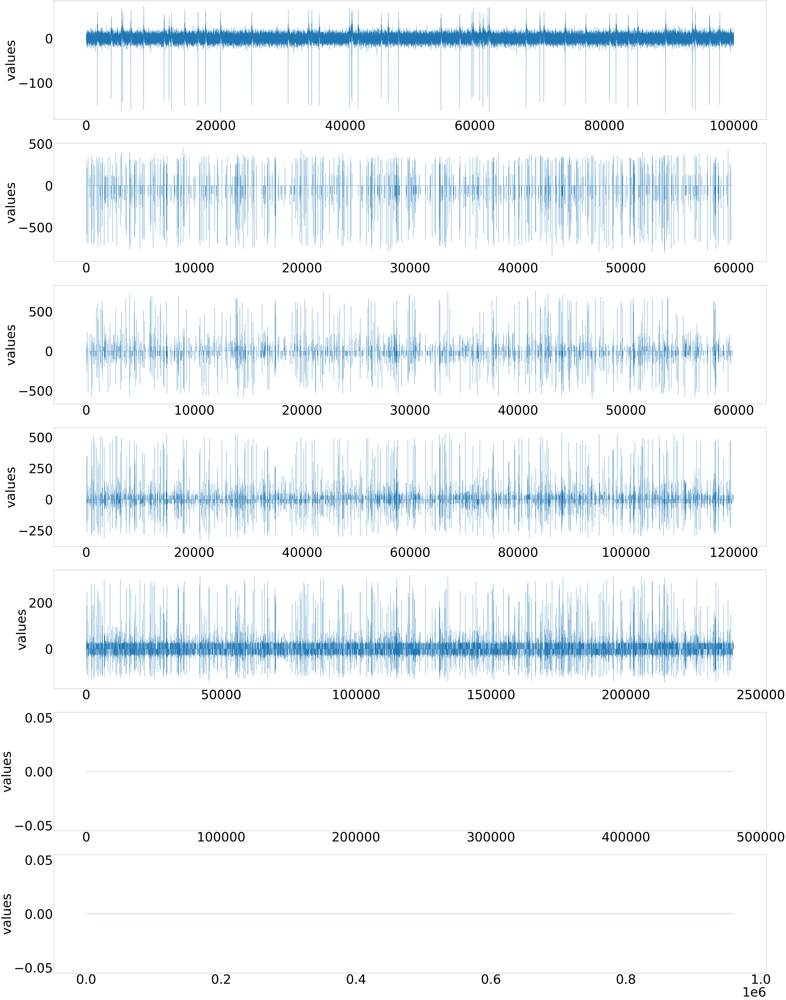

In [10]:
plt.figure(figsize=(15,8))
plt.rcParams['agg.path.chunksize'] = 10000
plt.figure(figsize=(100,140))
plt.subplot(l+2,1,1)
plt.plot(sv[:100000,0])
plt.ylabel('values', fontsize=100)
plt.rc('xtick', labelsize=100) 
plt.rc('ytick', labelsize=100)
plt.subplot(l+2,1,2)
plt.plot(s_coef[0])
plt.ylabel('values', fontsize=100)
for i in range(l):
    plt.subplot(l+2,1,i+3)
    plt.plot(s_coef[i+1])
    plt.ylabel('values', fontsize=100)
#    plt.title('detail'+str(i+1), fontsize=100)
    plt.rc('xtick', labelsize=100) 
    plt.rc('ytick', labelsize=100)

In [11]:
sv_t = np.zeros((ns, nch))
for i in range(nch):
    coeffs = pywt.wavedec(sv[:,i], 'haar', level=l)
    coeffs_t = trun2_coef(coeffs, .04)
    sv_t[:,i] = pywt.waverec(coeffs_t, 'haar') 

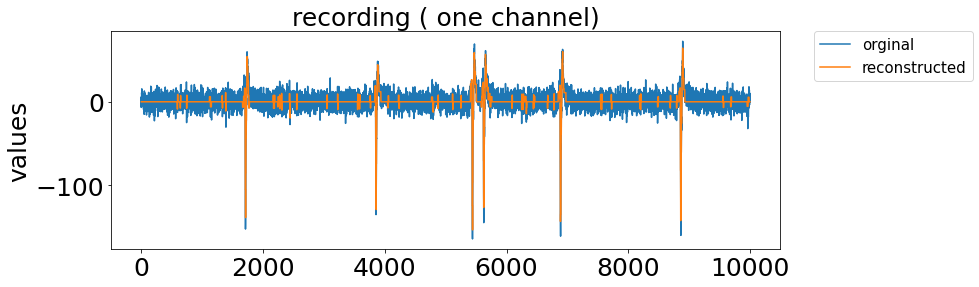

In [12]:
plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25)
plt.ylabel('values',fontsize=25)
plt.title('recording ( one channel)', fontsize=25)
plt.plot(sv[:10000,0], label='orginal')
plt.plot(sv_t[:10000,0], label='reconstructed')
plt.legend(bbox_to_anchor=(1.05, 1),
                         loc='upper left', borderaxespad=0.)

In [22]:
recording_t = se.NumpyRecording(sv_t, sampling_frequency=fs)
probe = recording.get_probe() # get the probe from orginal recording
recording_t = recording_t.set_probe(probe)

In [23]:
sorting_IC_t = ss.run_ironclust(recording=recording_t, output_folder='tmp_IC')

RUNNING SHELL SCRIPT: /tmp/tmp_shellscript2mdq56j4/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscriptm3i704z6/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscriptnbs3spir/script.sh
RUNNING SHELL SCRIPT: tmp_IC/run_ironclust.sh
The extractor was not dumpable


In [24]:
comparison_gt = sc.compare_sorter_to_ground_truth(tested_sorting=sorting_IC_t, gt_sorting=gt, exhaustive_gt=True)

PERFORMANCE (pooled_with_average)
-----------
ACCURACY: 84.05434220483488
RECALL: 84.42526258223559
PRECISION: 89.62008623140487
FALSE DISCOVERY RATE: 0.3799137685951298
MISS RATE: 5.574737417764411

SUMMARY
-------
GT num_units: 10
TESTED num_units: 24
num_well_detected: 8
num_redundant: 1
num_overmerged: 0
num_false_positive_units 13
num_bad: 15



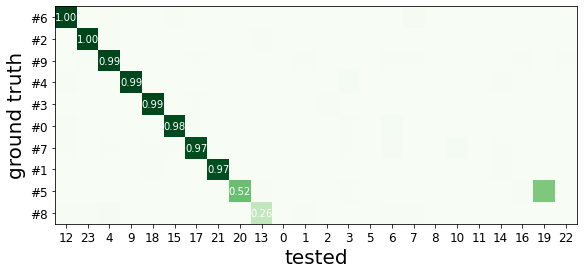

In [77]:
comparison_gt.print_performance()
comparison_gt.print_summary()
sw.plot_agreement_matrix(comparison_gt)

<AxesSubplot:title={'center':'recording ( one channel)'}, xlabel='measurement', ylabel='value'>

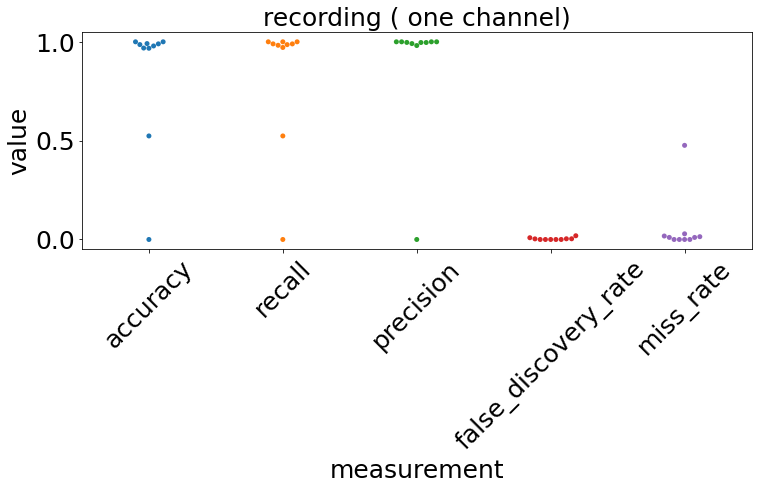

In [25]:
perf_IC = comparison_gt.get_performance()
s = perf_IC
perf2 = pd.melt(perf_IC, var_name='measurement')
plt.xticks(rotation=45)
plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25)
plt.xlabel('frequency', fontsize=25)
plt.ylabel('values', fontsize=25)
plt.title('recording ( one channel)', fontsize=25)
sns.swarmplot(data=perf2, x='measurement', y='value')

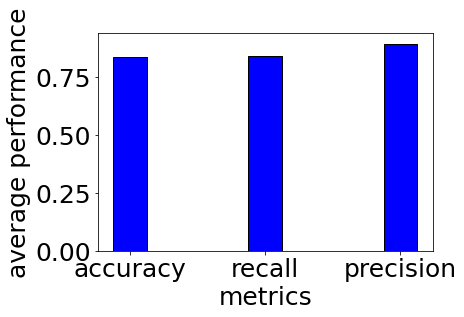

In [27]:
width = .25
plt.figure(figsize=(6,4))
n = ['accuracy', 'recall', 'precision']
plt.bar(n, s.mean().iloc[:3], color = 'b',
        width = width, edgecolor = 'black',
        label='average ')
plt.xlabel("metrics", fontsize = 25)
plt.ylabel("average performance", fontsize = 25)

plt.show()

In [32]:
recording_t.annotate(is_filtered=True)
we60 = si.extract_waveforms(recording_t, sorting_IC_t, folder='wf_quality_metrics',
                            overwrite=True, n_jobs=10,
                            chunk_size=recording_t.get_num_samples()//10,
                            progress_bar=True)

Setting 'return_scaled' to False
RecordingExtractor is not dumpable and can't be processed in parallel
RecordingExtractor is not dumpable and can't be processed in parallel


extract waveforms: 100%|########################| 10/10 [00:10<00:00,  1.08s/it]


In [33]:
qm = st.compute_quality_metrics(we60, metric_names=['snr', 'isi_violation', 'firing_rate'])
qm

/links/groups/hierlemann/spikesorting/miniconda3/envs/eazizi/lib/python3.8/site-packages/spikeinterface/toolkit/qualitymetrics/misc_metrics.py:120: RuntimeWarning: divide by zero encountered in double_scalars
  snrs[unit_id] = np.abs(amplitude) / noise


,snr,isi_violations_ratio,isi_violations_rate,isi_violations_count,firing_rate
0,inf,0.119185,2682.933333,160976,2739.266667
1,inf,0.141826,2335.366667,140122,2342.816667
2,inf,0.942328,0.450000,27,12.616667
3,inf,0.000000,0.000000,0,2.150000
4,inf,0.065243,0.033333,2,13.050000
5,inf,1.183432,0.016667,1,2.166667
6,inf,1.097394,0.016667,1,2.250000
7,inf,0.406056,27.916667,1675,151.383333
8,inf,0.748160,0.066667,4,5.450000
9,inf,0.000000,0.000000,0,4.766667


In [83]:
sv_t = np.zeros((ns,nch))
l = 5
for i in range(nch):
    coeffs = pywt.wavedec(sv[:,i], 'haar', level=l)
    coef_arr, coef_slices = pywt.coeffs_to_array(coeffs, padding=0, axes=None)
    coef_t = pywt.array_to_coeffs(make_sparse(coef_arr, ns//100), coef_slices, output_format='wavedec')
    sv_t[:,i] = pywt.waverec(coef_t, 'haar') 

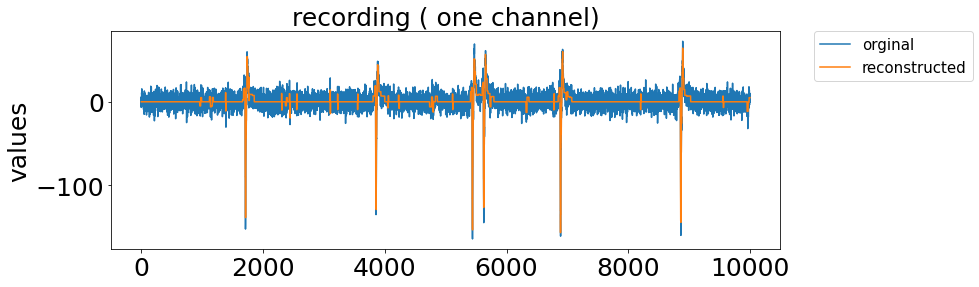

In [84]:
plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25)
plt.ylabel('values',fontsize=25)
plt.title('recording ( one channel)', fontsize=25)
plt.plot(sv[:10000,0], label='orginal')
plt.plot(sv_t[:10000,0], label='reconstructed')
plt.legend(bbox_to_anchor=(1.05, 1),
                         loc='upper left', borderaxespad=0.)

In [89]:
recording_t = se.NumpyRecording(sv_t, sampling_frequency=fs)
probe = recording.get_probe() # get the probe from orginal recording
recording_t = recording_t.set_probe(probe)

In [90]:
sorting_IC_t = ss.run_ironclust(recording=recording_t, detect_threshold= 50, output_folder='tmp_IC')

RUNNING SHELL SCRIPT: /tmp/tmp_shellscriptxscxevl2/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscript1luaap7l/script.sh
RUNNING SHELL SCRIPT: /tmp/tmp_shellscript626eu13a/script.sh
RUNNING SHELL SCRIPT: tmp_IC/run_ironclust.sh
The extractor was not dumpable


In [91]:
comparison_gt = sc.compare_sorter_to_ground_truth(tested_sorting=sorting_IC_t, gt_sorting=gt, exhaustive_gt=True)

PERFORMANCE (pooled_with_average)
-----------
ACCURACY: 83.96088583601446
RECALL: 88.84947746361989
PRECISION: 85.08031513127597
FALSE DISCOVERY RATE: 4.919684868724039
MISS RATE: 1.1505225363801042

SUMMARY
-------
GT num_units: 10
TESTED num_units: 172
num_well_detected: 8
num_redundant: 0
num_overmerged: 0
num_false_positive_units 163
num_bad: 163



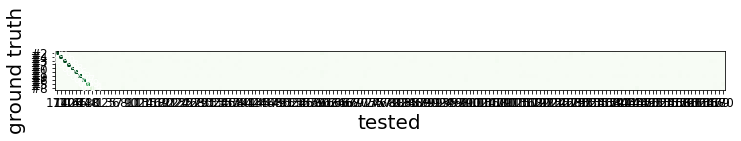

In [93]:
comparison_gt.print_performance()
comparison_gt.print_summary()
sw.plot_agreement_matrix(comparison_gt)

<AxesSubplot:title={'center':'recording ( one channel)'}, xlabel='measurement', ylabel='value'>

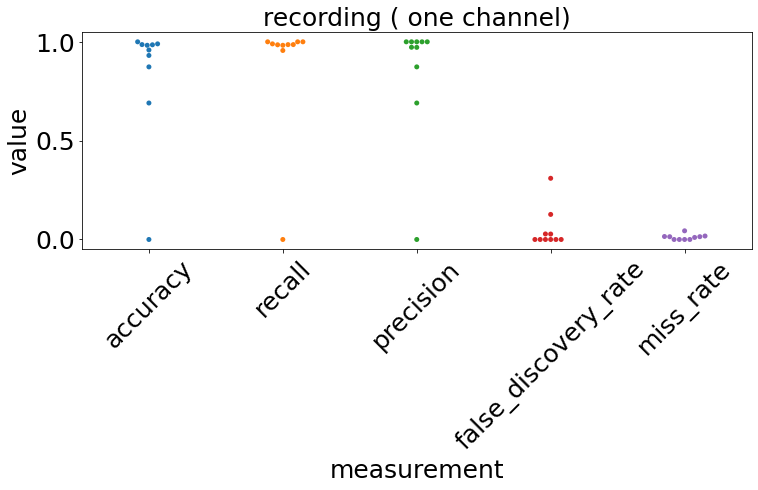

In [94]:
perf_IC = comparison_gt.get_performance()
s = perf_IC
perf2 = pd.melt(perf_IC, var_name='measurement')
plt.xticks(rotation=45)
plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25)
plt.xlabel('frequency', fontsize=25)
plt.ylabel('values', fontsize=25)
plt.title('recording ( one channel)', fontsize=25)
sns.swarmplot(data=perf2, x='measurement', y='value')

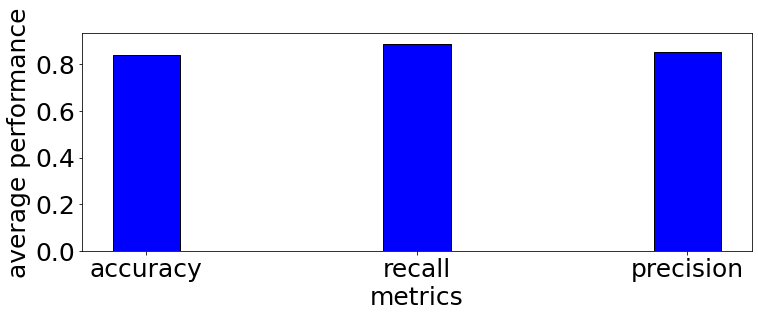

In [95]:
width = .25
n = ['accuracy', 'recall', 'precision']
plt.bar(n, s.mean().iloc[:3], color = 'b',
        width = width, edgecolor = 'black',
        label='average ')
plt.xlabel("metrics", fontsize = 25)
plt.ylabel("average performance", fontsize = 25)
plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20)

plt.show()

In [ ]:
recording_t.annotate(is_filtered=True)
we = si.extract_waveforms(recording_t, sorting_IC_t, folder='wf_quality_metrics', overwrite=True, n_jobs=5, chunk_size=recording_t.get_num_samples()//5, progress_bar=True)

Setting 'return_scaled' to False
RecordingExtractor is not dumpable and can't be processed in parallel
RecordingExtractor is not dumpable and can't be processed in parallel


extract waveforms:  60%|###########################################################################################2                                                            | 3/5 [00:47<00:33, 16.98s/it]

In [ ]:
qm = st.compute_quality_metrics(we, metric_names=['snr', 'isi_violation', 'firing_rate'])
qm

Sparse in time domain and wavelet domain, lower performance and need to post process to remove small spikes.<br>
The Compressed-Sensing recovery is hard due to the complex representation.